# Action Recognition in Videos
*(Using Convolutional Bi-Directional LSTMs with Attention layers)* 

#### **Topic Introduction**

With large amounts of data now being continuously uploaded in the form of videos every day, it is imperative that recognition of action being performed in videos is done by an automated entity. While image classification is mainstream in deep learning, identification of ‘action in videos’ is still a relatively novel task being performed only at big companies like Google and Amazon.

Action recognition in videos has immense scope in real life applications ranging from identifying hateful or sexual content on social media, to recognition of criminal acts and intent on CCTV footage. Such capabilities will provide the concerned authorities ability to manage potentially dangerous and murky situations proactively and in real time. It also finds immense scope in crucial tasks like video retrieval (in search engines) and human robot interactions.

#### **Approach Taken**

We are primarily gonna adopt the approach described in [this paper](https://khan-muhammad.github.io/public/papers/IEEE_Activity_TIE_2019.pdf). That is employing both Convolutional Neural Networks and Long-Short Term Memory models (to incorporate the sequential meaning of frames in videos). We are gonna use the [UCF-101](https://www.crcv.ucf.edu/data/UCF101.php) dataset for training and testing purposes. 

The approach can be broadly categorised into 6 stages:


1.   Extracting Frames
2.   Creating Models
3.   Preprocessing (Test/Train Split)
4.   Training
5.   Testing
6.   Trial on a single video



##### Installing the Necessary Dependencies into the framework

In [0]:
import torch

In [0]:
!pip show torch

Name: torch
Version: 1.5.0+cu101
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3
Location: /usr/local/lib/python3.6/dist-packages
Requires: future, numpy
Required-by: torchvision, torchtext, fastai


In [0]:
print(torch.__version__)

1.5.0+cu101


In [0]:
!pip install av

     |████████████████████████████████| 36.9MB 81kB/s 


In [0]:
!pip install sk-video

     |████████████████████████████████| 2.3MB 3.5MB/s 


In [0]:
!pip install Pillow

### **A. *Data Introduction***

The UCF-101 dataset used is among the largest and the most prominent datasets in the domain of human action recognition. 
* It consists of 13320 videos taken from YouTube, 
* All the videos are categorized according to 101 categories, with a range of action categories that include human-object interaction, body motion, human-human interaction, sports, etc.
* Each video is a six second clip of a certain action.

We choose to test our proposed framework with this particular dataset because it comprises of realistic actions being performed in real life, which is unique to this particular dataset. Some of the videos are captured from different viewpoints, with different illuminations, different poses. The entire raw data is downloaded and stored within the relative '/data/UCF-101/' data path. 

A crucial point to note here is that the data folders itself (within UCF-101) are indicative of the label (or category) of that video. So we are gonna have to use the os module to extract the labels corresponding to each video as well.


### Importing Packages

We have commented the categorization of the specific module where each particular library is being employed

In [0]:
# Extract Frames
import av
import glob
import os
import time
import tqdm
import datetime
import argparse

# Dataset
import random
import numpy as np
from torch import *
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms

# Model
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.models import resnet152

# Train
import sys
import itertools
# from models import *
# from dataset import *
from torch.utils.data import DataLoader

# Test_on_Video
# from models import *
# from dataset import *
# from data.extract_frames import extract_frames
from torchvision.utils import make_grid
from PIL import ImageDraw
import skvideo.io

### **B. *Extracting Frames***

The UCF-101 dataset comprises of videos. Our model requires a sequence of images representing the video. We need to decode our video and extract the frames from the videos and store them in a computable format. We perform this task in the extract_frames.py module of the project.

We have made use of several libraries like av, glob, and tqdm for this task. The resulting frames are stored in the format {Frames, Sequence_type, Sequence_Names}. Also, an additional folder ('UCF-101-frames') is created to house all the frames accroding to their label name.


In [0]:
# This function returns a generator of extracted frames of the video within the video_path
def extract_frames(video_path):
    frames = []
    video = av.open(video_path)
    for frame in video.decode(0):
        yield frame.to_image()


In [0]:
# This cell creates a new folder UCF-101-frames within the data folder and stores the frames of each video in indexed format
prev_time = time.time()
if __name__ == "__main__":
    dataset_path = "/content/drive/My Drive/Action-Recognition/data/UCF-101"
    '''
    parser = argparse.ArgumentParser()
    parser.add_argument("--dataset_path", type=str, default="UCF-101", help="Path to UCF-101 dataset")
    opt = parser.parse_args()
    print(opt)
    '''
    time_left = 0
    video_paths = glob.glob(os.path.join(dataset_path, "*", "*.avi"))
    for i, video_path in enumerate(video_paths):
        sequence_type, sequence_name = video_path.split(".avi")[0].split("/")[-2:]
        sequence_path = os.path.join(f"{dataset_path}-frames", sequence_type, sequence_name)

        if os.path.exists(sequence_path):
            continue

        os.makedirs(sequence_path, exist_ok=True)

        # Extract frames
        for j, frame in enumerate(
            tqdm.tqdm(
                extract_frames(video_path, time_left),
                desc=f"[{i}/{len(video_paths)}] {sequence_name} : ETA {time_left}",
            )
        ):
            frame.save(os.path.join(sequence_path, f"{j}.jpg"))

        # Determine approximate time left
        videos_left = len(video_paths) - (i + 1)
        time_left = datetime.timedelta(seconds=videos_left * (time.time() - prev_time))
        prev_time = time.time()

### **C. *Creating Models***

The [paper](https://khan-muhammad.github.io/public/papers/IEEE_Activity_TIE_2019.pdf) we adopted our approach from employs a special scheme for their model. It requires for them to have image tensors of the video (in sequence) and then we produce the convolutional features using CNN model. These convolutional features are then fed into the LSTM network for final inference. 

We will use Torch implementations of LSTM and CNN models to create the desired framework. The ConvLSTM is created by sequentially appending a LSTM network to the CNN features learned by the Resnet-92 pretrained network.

#### C.1. **Encoder**

In [0]:

class Encoder(nn.Module):
    def __init__(self, input_shape, latent_dim=512):
        super(Encoder, self).__init__()
        resnet = resnet152(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-1])
        self.final = nn.Sequential(
            nn.Linear(resnet.fc.in_features, latent_dim), nn.BatchNorm1d(latent_dim, momentum=0.01)
        )

    def forward(self, x):
        with torch.no_grad():
            x = self.feature_extractor(x)
        x = x.view(x.size(0), -1)
        return self.final(x)

'''

class Encoder(nn.Module):
    def __init__(self, latent_dim):
        super(Encoder, self).__init__()
        resnet = resnet152(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-1])
        self.final = nn.Sequential(
            nn.Linear(resnet.fc.in_features, latent_dim), nn.BatchNorm1d(latent_dim, momentum=0.01)
        )

    def forward(self, x):
        with torch.no_grad():
            x = self.feature_extractor(x)
        x = x.view(x.size(0), -1)
        return self.final(x)

'''



'\n\nclass Encoder(nn.Module):\n    def __init__(self, latent_dim):\n        super(Encoder, self).__init__()\n        resnet = resnet152(pretrained=True)\n        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-1])\n        self.final = nn.Sequential(\n            nn.Linear(resnet.fc.in_features, latent_dim), nn.BatchNorm1d(latent_dim, momentum=0.01)\n        )\n\n    def forward(self, x):\n        with torch.no_grad():\n            x = self.feature_extractor(x)\n        x = x.view(x.size(0), -1)\n        return self.final(x)\n\n'

#### C.2. **LSTM Network Module**

In [0]:


class LSTM(nn.Module):
    def __init__(self, latent_dim, num_classes, num_layers, hidden_dim):
        super(LSTM, self).__init__()
        self.hidden_dim = hidden_dim
        self.lstm = nn.LSTM(latent_dim, hidden_dim, num_layers, batch_first=True)
        self.final = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim, momentum=0.01),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes),
            nn.Softmax(dim=-1),
        )
        self.hidden_state = None

    def reset_hidden_state(self):
        self.hidden_state = None

    def forward(self, x):
        out, self.hidden_state = self.lstm(x, self.hidden_state)
        preds = self.final(out[:, -1])
        return preds

'''

class LSTM(nn.Module):
    def __init__(self, latent_dim, num_layers, hidden_dim, bidirectional):
        super(LSTM, self).__init__()
        self.lstm = nn.LSTM(latent_dim, hidden_dim, num_layers, batch_first=True, bidirectional=bidirectional)
        self.hidden_state = None

    def reset_hidden_state(self):
        self.hidden_state = None

    def forward(self, x):
        x, self.hidden_state = self.lstm(x, self.hidden_state)
        return x
'''

'\n\nclass LSTM(nn.Module):\n    def __init__(self, latent_dim, num_layers, hidden_dim, bidirectional):\n        super(LSTM, self).__init__()\n        self.lstm = nn.LSTM(latent_dim, hidden_dim, num_layers, batch_first=True, bidirectional=bidirectional)\n        self.hidden_state = None\n\n    def reset_hidden_state(self):\n        self.hidden_state = None\n\n    def forward(self, x):\n        x, self.hidden_state = self.lstm(x, self.hidden_state)\n        return x\n'

#### C.3. **Attention Module**

In [0]:

class Attention(nn.Module):
    def __init__(self, latent_dim, hidden_dim, attention_dim):
        super(Attention, self).__init__()
        self.latent_attention = nn.Linear(latent_dim, attention_dim)
        self.hidden_attention = nn.Linear(hidden_dim, attention_dim)
        self.joint_attention = nn.Linear(attention_dim, 1)

    def forward(self, latent_repr, hidden_repr):
        if hidden_repr is None:
            hidden_repr = [
                Variable(
                    torch.zeros(latent_repr.size(0), 1, self.hidden_attention.in_features), requires_grad=False
                ).float()
            ]
        h_t = hidden_repr[0]
        latent_att = self.latent_attention(latent_att)
        hidden_att = self.hidden_attention(h_t)
        joint_att = self.joint_attention(F.relu(latent_att + hidden_att)).squeeze(-1)
        attention_w = F.softmax(joint_att, dim=-1)
        return attention_w



#### C.4. **ConvLSTM Module**

In [0]:

class ConvLSTM(nn.Module):
    def __init__(self, input_shape, num_classes, latent_dim=512, lstm_layers=1, hidden_dim=1024):
        super(ConvLSTM, self).__init__()
        self.encoder = Encoder(input_shape, latent_dim)
        self.lstm = LSTM(latent_dim, num_classes, lstm_layers, hidden_dim)

    def forward(self, x):
        batch_size, seq_length, c, h, w = x.shape
        x = x.view(batch_size * seq_length, c, h, w)
        x = self.encoder(x)
        x = x.view(batch_size, seq_length, -1)
        x = self.lstm(x)
        return x

'''


class ConvLSTM(nn.Module):
    def __init__(
        self, num_classes, latent_dim=512, lstm_layers=1, hidden_dim=1024, bidirectional=True, attention=True
    ):
        super(ConvLSTM, self).__init__()
        self.encoder = Encoder(latent_dim)
        self.lstm = LSTM(latent_dim, lstm_layers, hidden_dim, bidirectional)
        self.output_layers = nn.Sequential(
            nn.Linear(2 * hidden_dim if bidirectional else hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim, momentum=0.01),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes),
            nn.Softmax(dim=-1),
        )
        self.attention = attention
        self.attention_layer = nn.Linear(2 * hidden_dim if bidirectional else hidden_dim, 1)

    def forward(self, x):
        batch_size, seq_length, c, h, w = x.shape
        x = x.view(batch_size * seq_length, c, h, w)
        x = self.encoder(x)
        x = x.view(batch_size, seq_length, -1)
        x = self.lstm(x)
        if self.attention:
            attention_w = F.softmax(self.attention_layer(x).squeeze(-1), dim=-1)
            x = torch.sum(attention_w.unsqueeze(-1) * x, dim=1)
        else:
            x = x[:, -1]
        return self.output_layers(x)
'''

'\n\n\nclass ConvLSTM(nn.Module):\n    def __init__(\n        self, num_classes, latent_dim=512, lstm_layers=1, hidden_dim=1024, bidirectional=True, attention=True\n    ):\n        super(ConvLSTM, self).__init__()\n        self.encoder = Encoder(latent_dim)\n        self.lstm = LSTM(latent_dim, lstm_layers, hidden_dim, bidirectional)\n        self.output_layers = nn.Sequential(\n            nn.Linear(2 * hidden_dim if bidirectional else hidden_dim, hidden_dim),\n            nn.BatchNorm1d(hidden_dim, momentum=0.01),\n            nn.ReLU(),\n            nn.Linear(hidden_dim, num_classes),\n            nn.Softmax(dim=-1),\n        )\n        self.attention = attention\n        self.attention_layer = nn.Linear(2 * hidden_dim if bidirectional else hidden_dim, 1)\n\n    def forward(self, x):\n        batch_size, seq_length, c, h, w = x.shape\n        x = x.view(batch_size * seq_length, c, h, w)\n        x = self.encoder(x)\n        x = x.view(batch_size, seq_length, -1)\n        x = self.ls

### **D. *Preprocessing (Test/Train Split)***

This function performs the task of opening the frames, making sure they are of the right size (& adds padding if they are not). It also performs the essential task of extracting label names corresponding to each video. It then converts those frames into tensors using transformations, and then based on the split_number sent by the calling function, it creates a training and test set.

In [0]:
# Normalization parameters for pre-trained PyTorch models
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])


class Dataset(Dataset):
    def __init__(self, dataset_path, split_path, split_number, input_shape, sequence_length, training):
        self.training = training
        self.label_index = self._extract_label_mapping(split_path)
        self.sequences = self._extract_sequence_paths(dataset_path, split_path, split_number, training)
        self.sequence_length = sequence_length
        self.label_names = sorted(list(set([self._activity_from_path(seq_path) for seq_path in self.sequences])))
        self.num_classes = len(self.label_names)
        self.transform = transforms.Compose(
            [
                transforms.Resize(input_shape[-2:], Image.BICUBIC),
                transforms.ToTensor(),
                transforms.Normalize(mean, std),
            ]
        )

    def _extract_label_mapping(self, split_path="/content/drive/My Drive/Action-Recognition/data/ucfTrainTestlist"):
        """ Extracts a mapping between activity name and softmax index """
        with open(os.path.join(split_path, "classInd.txt")) as file:
            lines = file.read().splitlines()
        label_mapping = {}
        for line in lines:
            label, action = line.split()
            label_mapping[action] = int(label) - 1
        return label_mapping

    def _extract_sequence_paths(
        self, dataset_path, split_path="/content/drive/My Drive/Action-Recognition/data/ucfTrainTestlist", split_number=1, training=True
    ):
        """ Extracts paths to sequences given the specified train / test split """
        assert split_number in [1, 2, 3], "Split number has to be one of {1, 2, 3}"
        fn = f"trainlist0{split_number}.txt" if training else f"testlist0{split_number}.txt"
        split_path = os.path.join(split_path, fn)
        with open(split_path) as file:
            lines = file.read().splitlines()
        sequence_paths = []
        for line in lines:
            seq_name = line.split(".avi")[0]
            sequence_paths += [os.path.join(dataset_path, seq_name)]
        return sequence_paths

    def _activity_from_path(self, path):
        """ Extracts activity name from filepath """
        return path.split("/")[-2]

    def _frame_number(self, image_path):
        """ Extracts frame number from filepath """
        return int(image_path.split("/")[-1].split(".jpg")[0])

    def _pad_to_length(self, sequence):
        """ Pads the sequence to required sequence length """
        left_pad = sequence[0]
        if self.sequence_length is not None:
            while len(sequence) < self.sequence_length:
                sequence.insert(0, left_pad)
        return sequence

    def __getitem__(self, index):
        sequence_path = self.sequences[index % len(self)]
        # Sort frame sequence based on frame number
        image_paths = sorted(glob.glob(f"{sequence_path}/*.jpg"), key=lambda path: self._frame_number(path))
        # Pad frames sequences shorter than `self.sequence_length` to length
        image_paths = self._pad_to_length(image_paths)
        if self.training:
            # Randomly choose sample interval and start frame
            sample_interval = np.random.randint(1, len(image_paths) // self.sequence_length + 1)
            start_i = np.random.randint(0, len(image_paths) - sample_interval * self.sequence_length + 1)
            flip = np.random.random() < 0.5
        else:
            # Start at first frame and sample uniformly over sequence
            start_i = 0
            sample_interval = 1 if self.sequence_length is None else len(image_paths) // self.sequence_length
            flip = False
        # Extract frames as tensors
        image_sequence = []
        for i in range(start_i, len(image_paths), sample_interval):
            if self.sequence_length is None or len(image_sequence) < self.sequence_length:
                image_tensor = self.transform(Image.open(image_paths[i]))
                if flip:
                    image_tensor = torch.flip(image_tensor, (-1,))
                image_sequence.append(image_tensor)
        image_sequence = torch.stack(image_sequence)
        target = self.label_index[self._activity_from_path(sequence_path)]
        return image_sequence, target

    def __len__(self):
        return len(self.sequences)

### **E. *Training***

The primary wrapper function which uses the dataset function for importing data in the correct form of tensors. We employ cross entropy loss function as the scoring metric, alongwith Adam optimizer for quickest convergence. It then trains the ConvLSTM model to the given data. The trained checkpoint model is saved in the root directory.

The steps performed at this stage are in following order:
1.   The image dimensions, the latent_dimensions (for ConvLSTM), the path to save check_point model, the number of epochs, are all initialised.
2.   The train and test dataset are defined and then loaded using the dataloader.
3.   The model is initialised and trained over the number of epochs defined

In [0]:
if __name__ == "__main__":
    dataset_path = "/content/drive/My Drive/Action-Recognition/data/UCF-101-frames"
    split_path = "/content/drive/My Drive/Action-Recognition/data/ucfTrainTestlist"
    split_number = 1
    num_epochs = 100
    batch_size = 16
    sequence_length = 40
    img_dim = 224
    channels = 3
    latent_dim = 512
    checkpoint_model = "/content/drive/My Drive/Action-Recognition"
    checkpoint_interval = 5

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    image_shape = (channels, img_dim, img_dim)

    # Define training set
    train_dataset = Dataset(
        dataset_path=dataset_path,
        split_path=split_path,
        split_number=split_number,
        input_shape=image_shape,
        sequence_length=sequence_length,
        training=True,
    )
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

    # Define test set
    test_dataset = Dataset(
        dataset_path=dataset_path,
        split_path=split_path,
        split_number=split_number,
        input_shape=image_shape,
        sequence_length=sequence_length,
        training=False,
    )
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Classification criterion
    cls_criterion = nn.CrossEntropyLoss().to(device)

    # Define network
    model = ConvLSTM(
        num_classes=train_dataset.num_classes,
        latent_dim=latent_dim,
        lstm_layers=1,
        hidden_dim=1024,
        bidirectional=True,
        attention=True,
    )
    model = model.to(device)

    # Add weights from checkpoint model if specified
    if checkpoint_model:
        model.load_state_dict(torch.load(checkpoint_model))

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

    def test_model(epoch):
        """ Evaluate the model on the test set """
        print("")
        model.eval()
        test_metrics = {"loss": [], "acc": []}
        for batch_i, (X, y) in enumerate(test_dataloader):
            image_sequences = Variable(X.to(device), requires_grad=False)
            labels = Variable(y, requires_grad=False).to(device)
            with torch.no_grad():
                # Reset LSTM hidden state
                model.lstm.reset_hidden_state()
                # Get sequence predictions
                predictions = model(image_sequences)
            # Compute metrics
            acc = 100 * (predictions.detach().argmax(1) == labels).cpu().numpy().mean()
            loss = cls_criterion(predictions, labels).item()
            # Keep track of loss and accuracy
            test_metrics["loss"].append(loss)
            test_metrics["acc"].append(acc)
            # Log test performance
            sys.stdout.write(
                "\rTesting -- [Batch %d/%d] [Loss: %f (%f), Acc: %.2f%% (%.2f%%)]"
                % (
                    batch_i,
                    len(test_dataloader),
                    loss,
                    np.mean(test_metrics["loss"]),
                    acc,
                    np.mean(test_metrics["acc"]),
                )
            )
        model.train()
        print("")

    for epoch in range(num_epochs):
        epoch_metrics = {"loss": [], "acc": []}
        prev_time = time.time()
        print(f"--- Epoch {epoch} ---")
        for batch_i, (X, y) in enumerate(train_dataloader):

            if X.size(0) == 1:
                continue

            image_sequences = Variable(X.to(device), requires_grad=True)
            labels = Variable(y.to(device), requires_grad=False)

            optimizer.zero_grad()

            # Reset LSTM hidden state
            model.lstm.reset_hidden_state()

            # Get sequence predictions
            predictions = model(image_sequences)

            # Compute metrics
            loss = cls_criterion(predictions, labels)
            acc = 100 * (predictions.detach().argmax(1) == labels).cpu().numpy().mean()

            loss.backward()
            optimizer.step()

            # Keep track of epoch metrics
            epoch_metrics["loss"].append(loss.item())
            epoch_metrics["acc"].append(acc)

            # Determine approximate time left
            batches_done = epoch * len(train_dataloader) + batch_i
            batches_left = num_epochs * len(train_dataloader) - batches_done
            time_left = datetime.timedelta(seconds=batches_left * (time.time() - prev_time))
            prev_time = time.time()

            # Print log
            sys.stdout.write(
                "\r[Epoch %d/%d] [Batch %d/%d] [Loss: %f (%f), Acc: %.2f%% (%.2f%%)] ETA: %s"
                % (
                    epoch,
                    num_epochs,
                    batch_i,
                    len(train_dataloader),
                    loss.item(),
                    np.mean(epoch_metrics["loss"]),
                    acc,
                    np.mean(epoch_metrics["acc"]),
                    time_left,
                )
            )

            # Empty cache
            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        # Evaluate the model on the test set
        test_model(epoch)

        # Save model checkpoint
        if epoch % checkpoint_interval == 0:
            os.makedirs("model_checkpoints", exist_ok=True)
            torch.save(model.state_dict(), f"model_checkpoints/{model.__class__.__name__}_{epoch}.pth")

### **F. *Testing***

In this phaze we test the accuracy measure of our trained model on the set of videos that we had saved earlier during our test/train split. Our model achieves an accuracy of about ~92%.

In [0]:
if __name__ == "__main__":
    dataset_path = "/content/drive/My Drive/Action-Recognition/data/UCF-101-frames"
    split_path = "/content/drive/My Drive/Action-Recognition/data/ucfTrainTestlist"
    split_number = 1
    img_dim = 224
    channels = 3
    latent_dim = 512
    checkpoint_model = "/content/drive/My Drive/Action-Recognition" # Have to adjust this checkpoint_model path according to the produced value from Train cell

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    image_shape = (channels, img_dim, img_dim)

    # Define test set
    test_dataset = Dataset(
        dataset_path=dataset_path,
        split_path=split_path,
        split_number=split_number,
        input_shape=image_shape,
        sequence_length=None,
        training=False,
    )
    test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

    # Define network
    model = ConvLSTM(
        num_classes=train_dataset.num_classes,
        latent_dim=latent_dim,
        lstm_layers=1,
        hidden_dim=1024,
        bidirectional=True,
    )
    model = model.to(device)
    model.load_state_dict(torch.load(checkpoint_model))
    model.eval()

    test_accuracies = []
    for batch_i, (X, y) in enumerate(test_dataloader):
        image_sequences = Variable(X.to(device), requires_grad=False)
        labels = Variable(y, requires_grad=False).to(device)
        with torch.no_grad():
            # Reset LSTM hidden state
            model.lstm.reset_hidden_state()
            # Get sequence predictions
            predictions = model(image_sequences)
            loss = 0
            # Update loss and prediction histogram at each timestep
            pred_hists = np.zeros((predictions.size(0), predictions.size(-1)))
            for t in range(sequence_length):
                # Update classification loss
                loss += cls_criterion(predictions[:, t], labels).item() / sequence_length
                # Update prediction histogram
                pred_hists[:, predictions[:, t].argmax(1).cpu().numpy()] += 1
        # Compute accuracy using the most common prediction for each sequence
        acc = 100 * np.mean(pred_hists.argmax(1) == labels.cpu().numpy())
        # Keep track of accuracy
        test_accuracies.append(acc)
        # Log test performance
        sys.stdout.write(
            "\rTesting -- [Batch %d/%d] [Loss: %f (%f), Acc: %.2f%% (%.2f%%)]"
            % (batch_i, len(test_dataloader), loss, np.mean(test_metrics["loss"]), acc, np.mean(test_accuracies))
        )

### **G. *Trial_Testing***

We use this phase to test our model on a single video. The video thus derived is first passed through the extract_frames function to extract each individual frame, then it is transformed such that we get the image tensors for each individual frame. We then predict the action being performed in the video using our pretrained model. This prediction is then "Drawn" onto the image using Image Draw and we then concat these images together to produce a gif file which is saved locally, and displayed on the notebook itself.

In [0]:
if __name__ == "__main__":
    video_path = "/content/drive/My Drive/Action-Recognition/data/UCF-101/Archery/v_Archery_g02_c01.avi" # Can change it to whichever video we want to predict
    dataset_path = "/content/drive/My Drive/Action-Recognition/data/UCF-101" # The actual value should be UCF-101-frames
    image_dim = 112
    channels = 3
    latent_dim = 512
    checkpoint_model = "/content/drive/My Drive/Action-Recognition/ConvLSTM_150.pth"

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_shape = (channels, image_dim, image_dim)

    transform = transforms.Compose(
        [
            transforms.Resize(input_shape[-2:], Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        ]
    )

    labels = sorted(list(set(os.listdir(dataset_path))))

    # Define model and load model checkpoint
    model = ConvLSTM(input_shape=input_shape, num_classes=len(labels), latent_dim=latent_dim)
    # model = ConvLSTM(num_classes=len(labels), latent_dim=latent_dim)
    model.to(device)
    #state_dict = torch.load(checkpoint_model)
    #display(state_dict)
    
    model.load_state_dict(torch.load(checkpoint_model))
    model.eval()

    # Extract predictions
    output_frames = []
    for frame in tqdm.tqdm(extract_frames(video_path), desc="Processing frames"):
        image_tensor = Variable(transform(frame)).to(device)
        image_tensor = image_tensor.view(1, 1, *image_tensor.shape)

        # Get label prediction for frame
        with torch.no_grad():
            prediction = model(image_tensor)
            predicted_label = labels[prediction.argmax(1).item()]

        # Draw label on frame
        d = ImageDraw.Draw(frame)
        d.text(xy=(10, 10), text=predicted_label, fill=(255, 255, 255))

        output_frames += [frame]

    # Create video from frames
    writer = skvideo.io.FFmpegWriter("/content/drive/My Drive/Action-Recognition/data/output4.gif")
    for frame in tqdm.tqdm(output_frames, desc="Writing to video"):
        writer.writeFrame(np.array(frame))
    writer.close()

   

Processing frames: 158it [00:07, 21.59it/s]
Writing to video: 100%|██████████| 158/158 [00:00<00:00, 210.77it/s]


### **Displaying Output**

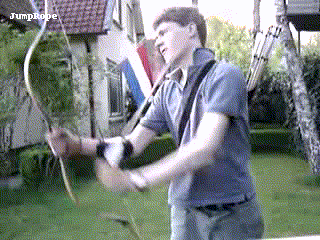

In [0]:
from IPython.display import Image
with open('/content/drive/My Drive/Action-Recognition/data/output4.gif','rb') as f:
    display(Image(data=f.read(), format='png', width = 600, height = 500))

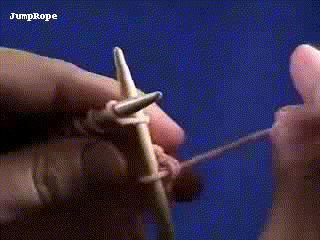

In [0]:
from IPython.display import Image
with open('/content/drive/My Drive/Action-Recognition/data/output1.gif','rb') as f:
    display(Image(data=f.read(), format='png', width = 600, height = 500))

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
